In [1]:
import scanpy as sc
from sklearn.neighbors import NearestNeighbors
import matplotlib.pyplot as plt
import numpy as np
import os
from sklearn.decomposition import PCA

In [2]:
basepath = '/stanley/WangLab/kamal/code/remote_notebooks/spatial_autocovariance/figures/'
figsize = (5,6)
s = 10
dpi = 300
region_cmap = {str(i):sc.pl.palettes.default_102[i] for i in range(40)}

In [3]:
adata = sc.read_h5ad('/stanley/WangLab/kamal/code/remote_notebooks/spatial_autocorrelation/adata_all_techniques.h5ad')

In [7]:
adata

AnnData object with n_obs × n_vars = 37928 × 1022
    obs: 'orginindex', 'sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'n_genes', 'n_counts', 'name', 'mouseID', 'batch', 'cell_center_1', 'cell_center_2', 'cell_center_3', 'CellLabel_rank4', 'x', 'y', 'segment', 'cell_mark', 'smooth', 'smooth_subsampled', 'concat', 'region_smooth_subsampled', 'region_concat', 'normalized', 'celltype_normalized'
    var: 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'celltype_normalized_colors', 'concat', 'concat_colors', 'hvg', 'leiden', 'neighbors', 'normalized', 'normalized_colors', 'pca', 'region_concat_colors', 'region_smooth_subsampled_colors', 'segment', 'smooth', 'smooth_colors', 'smooth_subsampled', 'smooth_subsampled_colors', 'umap'
    obsm: 'X_nbr_pca', 'X_pca', 'X_pca_concat'

# Load data

In [5]:
adata = sc.read_h5ad('/stanley/WangLab/kamal/code/remote_notebooks/mpfc_demo/adata_demo.h5ad')
# adata = sc.read_h5ad('/stanley/WangLab/kamal/data/marmoset/mpfc/mpfc_preprocessed.h5ad')
adata.layers['normalized'] = adata.X.copy()

In [8]:
def get_nbrs(adata, num_nbrs, spatial_key='spatial'):

    coordinates = adata.obsm[spatial_key]
    nbrs = NearestNeighbors(n_neighbors=num_nbrs)
    nbrs.fit(coordinates)
    nbr_dists, nbr_idxs = nbrs.kneighbors(coordinates)

    return nbr_dists, nbr_idxs


def smooth(adata, nbr_idxs, num_samples):

    nbr_idxs_sampled = [np.random.choice(idxs, size=num_samples, replace=True) for idxs in nbr_idxs]
    X_smooth = np.zeros(adata.X.shape)
    for nth_nbrs in np.array(nbr_idxs_sampled).T:
        X_smooth += adata.X[nth_nbrs] / num_samples

    return X_smooth

def concat(adata, nbr_idxs):

    X_concat = []
    for nth_nbrs in np.array(nbr_idxs).T:
        X_concat.append(adata.X[nth_nbrs])

    return np.hstack(X_concat)

In [7]:
# num_nbrs = 30
# _, nbr_idxs = get_nbrs(adata, num_nbrs)
# adata.layers['smooth'] = smooth(adata, nbr_idxs, num_nbrs)
# adata.layers['smooth_subsampled'] = smooth(adata, nbr_idxs, 10)
# adata.obsm['concat'] = concat(adata, nbr_idxs)

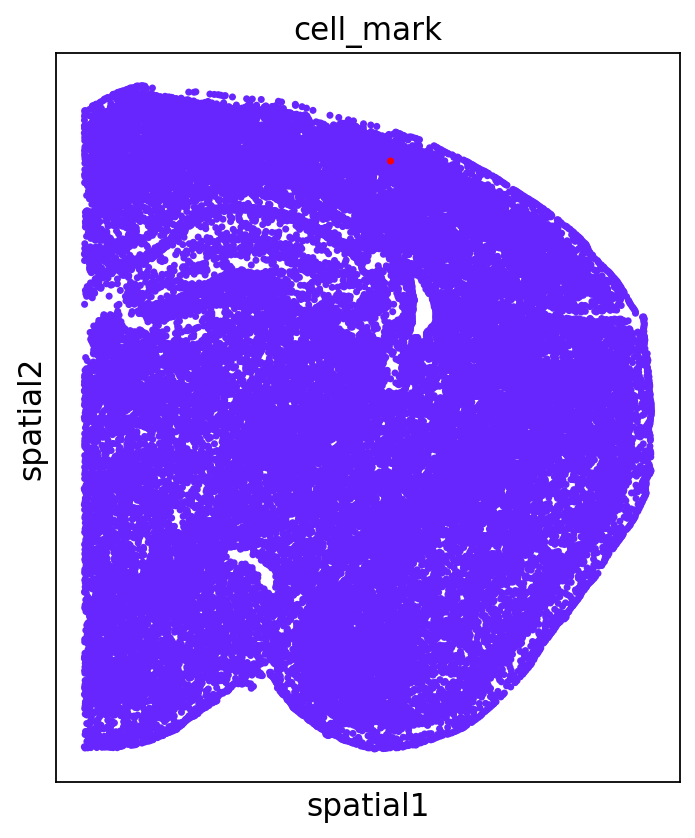

In [9]:
cell_idx = 13000
cell_mark = np.zeros(len(adata))
cell_mark[cell_idx] = 1
adata.obs['cell_mark'] = cell_mark

sc.set_figure_params(figsize=figsize)
# sc.pl.embedding(adata, basis='spatial', color='cell_mark', cmap='rainbow', s=40, vmin=-0.05, colorbar_loc=None, return_fig=True)
sc.pl.embedding(adata, basis='spatial', color='cell_mark', cmap='rainbow', s=40, vmin=-0.05, colorbar_loc=None)
# plt.axis('off')
# plt.title('')
# figname = f'cell_mark.png'
# savepath = os.path.join(basepath, figname)
# plt.savefig(savepath, bbox_inches='tight', transparent=True, dpi=dpi)

# Single-cell

### Similarities

In [6]:
adata.layers['normalized'] = adata.X.copy()

In [12]:
layer = 'normalized'

X = adata.layers[layer].copy()
# adata.obs['similarity'] = X[cell_idx] @ X.T
# other_cell_idxs = np.where(np.arange(len(adata)) != cell_idx)[0]
# subdata = adata[other_cell_idxs]

# sc.set_figure_params(figsize=figsize)
# sc.pl.embedding(subdata, basis='spatial', color='similarity', cmap='rainbow', s=20, colorbar_loc=None, return_fig=True)
# plt.axis('off')
# plt.title('')
# figname = f'similarity_{layer}.png'
# savepath = os.path.join(basepath, figname)
# plt.savefig(savepath, bbox_inches='tight', transparent=True, dpi=dpi)

### Clustering

In [13]:
pca = PCA(n_components=50)
adata.obsm[f'X_pca_{layer}'] = pca.fit_transform(X)

sc.pp.neighbors(adata, use_rep=f'X_pca_{layer}', key_added=layer)
sc.tl.leiden(adata, neighbors_key=layer, key_added=layer, resolution=0.5)
adata.obsm[f'X_umap_{layer}'] = sc.tl.umap(adata, neighbors_key=layer, copy=True).obsm['X_umap']

In [27]:
sc.tl.leiden(adata, neighbors_key=layer, key_added=layer, resolution=0.4)

In [28]:
adata.obs[layer].unique()

['6', '4', '2', '0', '14', ..., '19', '5', '8', '22', '17']
Length: 23
Categories (23, object): ['0', '1', '2', '3', ..., '19', '20', '21', '22']

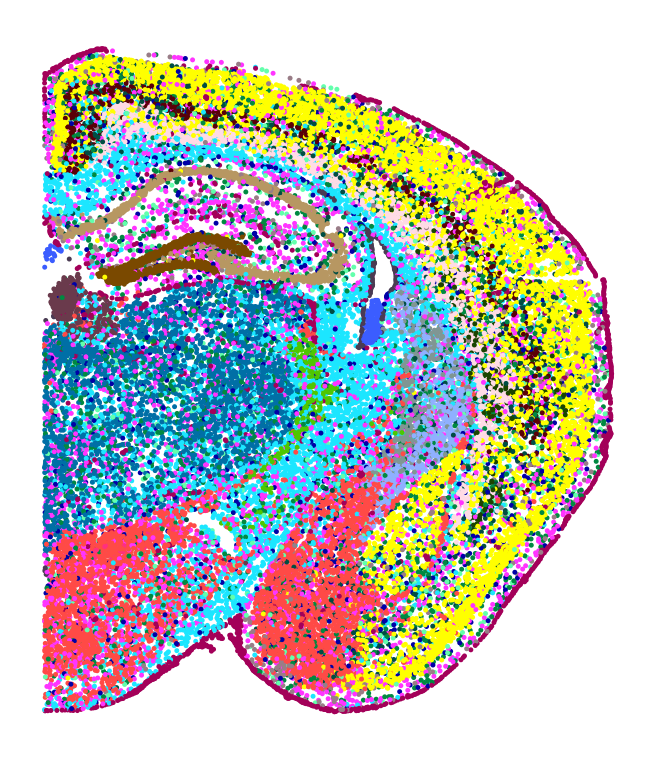

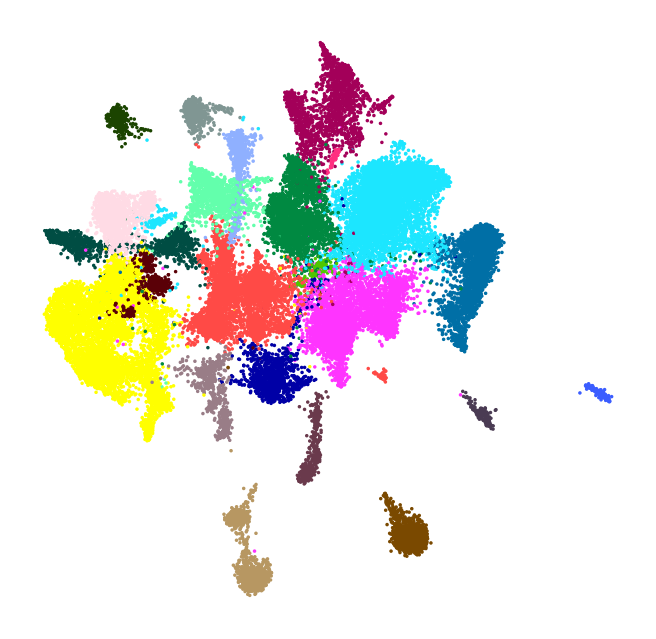

In [29]:
sc.set_figure_params(figsize=figsize)
sc.pl.embedding(adata, basis='spatial', color=layer, s=20, legend_loc=None, return_fig=True, title='', palette=region_cmap)
plt.axis('off')
figname = f'tissue_colored_by_regions_{layer}.png'
savepath = os.path.join(basepath, figname)
plt.savefig(savepath, bbox_inches='tight', transparent=True, dpi=dpi)

sc.set_figure_params(figsize=(5,5))
sc.pl.embedding(adata, basis=f'X_umap_{layer}', color=layer, s=10, legend_loc=None, return_fig=True, title='', palette=region_cmap)
plt.axis('off')
figname = f'umap_colored_by_regions_{layer}.png'
savepath = os.path.join(basepath, figname)
plt.savefig(savepath, bbox_inches='tight', transparent=True, dpi=dpi)

## Recolor

In [30]:
adata_old = sc.read_h5ad('/stanley/WangLab/kamal/code/remote_notebooks/mpfc_demo/adata_demo_spin.h5ad')
adata_old.obsm['X_umap_new'] = adata.obsm['X_umap_normalized']

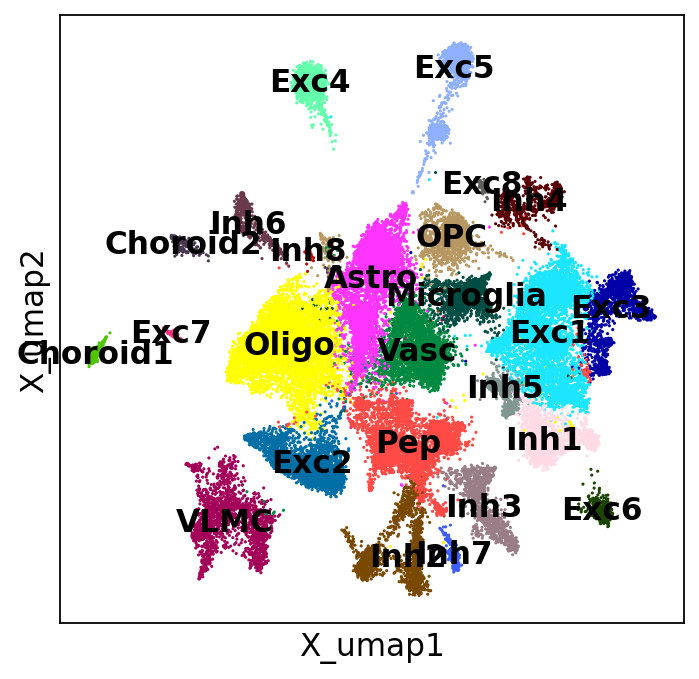

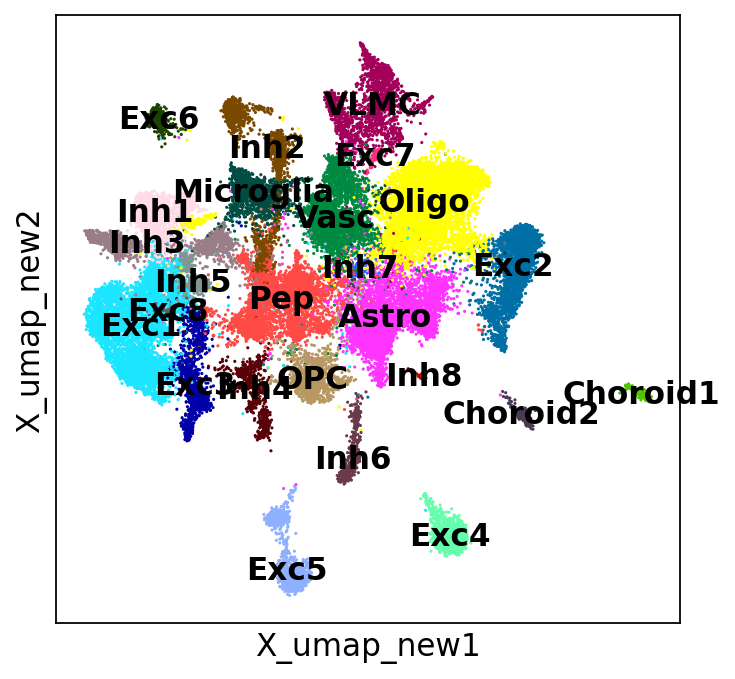

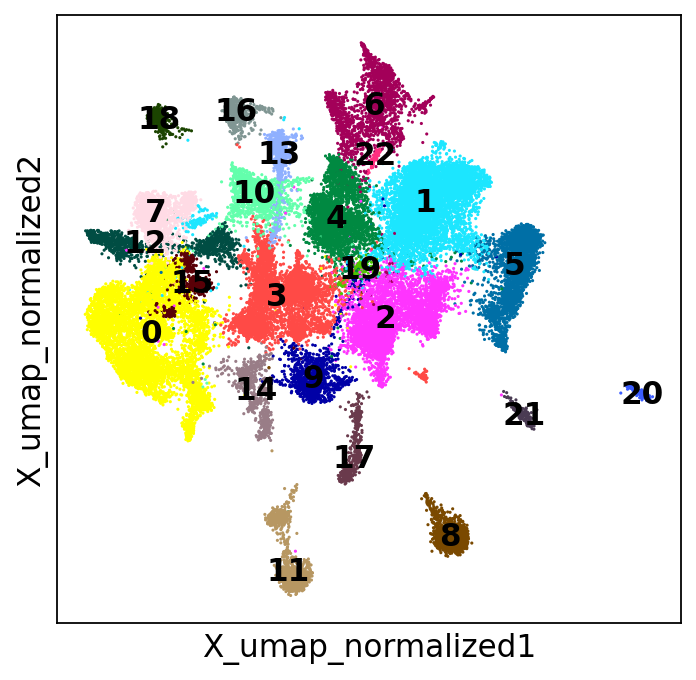

In [39]:
sc.set_figure_params(figsize=(5,5))
sc.pl.embedding(adata_old, basis='X_umap', color='celltype', s=8, title='', legend_loc='on data')
sc.pl.embedding(adata_old, basis='X_umap_new', color='celltype', s=8, title='', legend_loc='on data')
sc.pl.embedding(adata, basis='X_umap_normalized', color='normalized', s=8, title='', legend_loc='on data')

In [41]:
leiden2celltype = {
    '0': 'Exc1',
    '1': 'Oligo',
    '2': 'Astro',
    '3': 'Pep',
    '4': 'Vasc',
    '5': 'Exc2',
    '6': 'VLMC',
    '7': 'Inh1',
    '8': 'Exc3',
    '9': 'OPC',
    '10': 'Micro',
    '11': 'Exc4',
    '12': 'Inh2',
    '13': 'Inh3',
    '14': 'Inh4',
    '15': 'Inh5',
    '16': 'Inh6',
    '17': 'Inh7',
    '18': 'Exc5',
    '19': 'Inh8',
    '20': 'Choroid1',
    '21': 'Choroid2',
    '22': 'Exc6',
}
adata.obs[f'celltype_{layer}'] = adata.obs[layer].map(leiden2celltype)
adata.obs[f'celltype_{layer}'] = adata.obs[f'celltype_{layer}'].astype('category')
celltypes = adata.obs[f'celltype_{layer}'].value_counts().index
palette = sc.pl.palettes.default_102
cmap = {celltypes[i]:palette[i] for i in range(len(celltypes))}

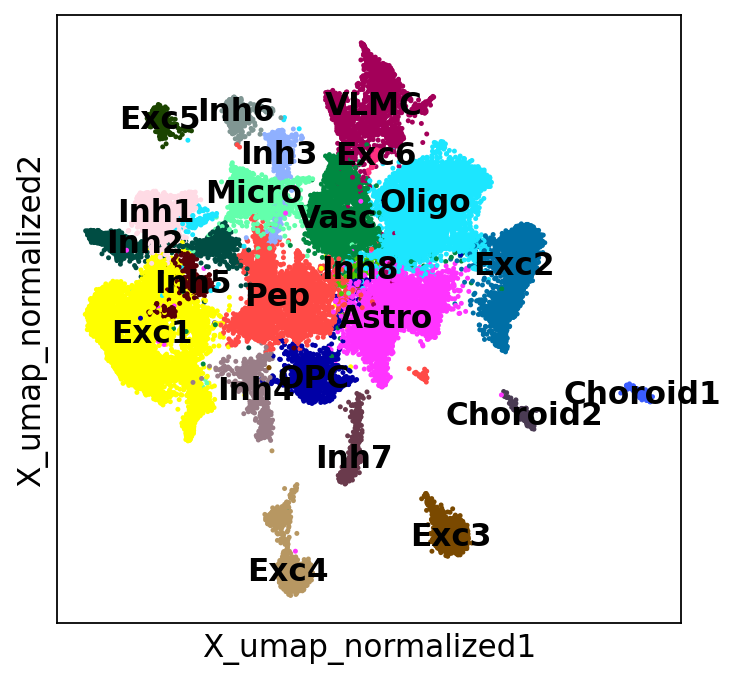

In [49]:
sc.pl.embedding(adata, basis='X_umap_normalized', color=f'celltype_{layer}', s=20, legend_loc='on data', title='', palette=cmap)

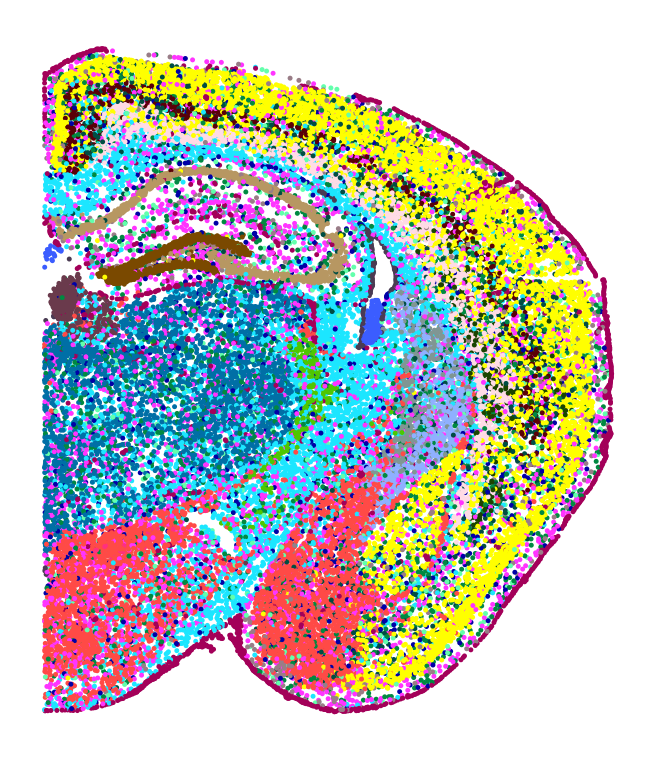

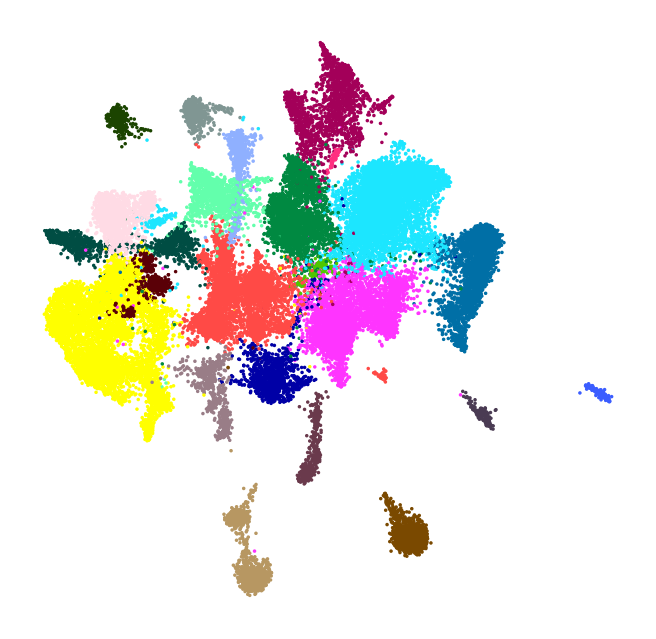

In [47]:
sc.set_figure_params(figsize=figsize)
sc.pl.embedding(adata, basis='spatial', color=f'celltype_{layer}', s=20, legend_loc=None, return_fig=True, title='', palette=cmap)
plt.axis('off')
figname = f'tissue_colored_by_regions_{layer}.png'
savepath = os.path.join(basepath, figname)
plt.savefig(savepath, bbox_inches='tight', transparent=True, dpi=dpi)

sc.set_figure_params(figsize=(5,5))
sc.pl.embedding(adata, basis=f'X_umap_{layer}', color=f'celltype_{layer}', s=10, legend_loc=None, return_fig=True, title='', palette=cmap)
plt.axis('off')
figname = f'umap_colored_by_regions_{layer}.png'
savepath = os.path.join(basepath, figname)
plt.savefig(savepath, bbox_inches='tight', transparent=True, dpi=dpi)

# Smooth (no correction)

### Similarities

In [13]:
layer = 'smooth'

# X = adata.layers[layer].copy()
# adata.obs['similarity'] = X[cell_idx] @ X.T
# other_cell_idxs = np.where(np.arange(len(adata)) != cell_idx)[0]
# subdata = adata[other_cell_idxs]

# sc.set_figure_params(figsize=figsize)
# sc.pl.embedding(subdata, basis='spatial', color='similarity', cmap='rainbow', s=20, colorbar_loc=None, return_fig=True, title='')
# plt.axis('off')
# figname = f'similarity_{layer}.png'
# savepath = os.path.join(basepath, figname)
# plt.savefig(savepath, bbox_inches='tight', transparent=True, dpi=dpi)

### Clustering

In [11]:
pca = PCA(n_components=50)
adata.obsm[f'X_pca_{layer}'] = pca.fit_transform(X)

sc.pp.neighbors(adata, use_rep=f'X_pca_{layer}', key_added=layer)
sc.tl.leiden(adata, neighbors_key=layer, key_added=layer, resolution=0.7)
adata.obsm[f'X_umap_{layer}'] = sc.tl.umap(adata, neighbors_key=layer, copy=True).obsm['X_umap']

NameError: name 'X' is not defined

In [ ]:
# sc.tl.leiden(adata, neighbors_key=layer, key_added=layer, resolution=0.12)

In [ ]:
# adata.obs[layer].unique()

['18', '10', '2', '8', '11', ..., '3', '9', '6', '12', '21']
Length: 23
Categories (23, object): ['0', '1', '2', '3', ..., '19', '20', '21', '22']

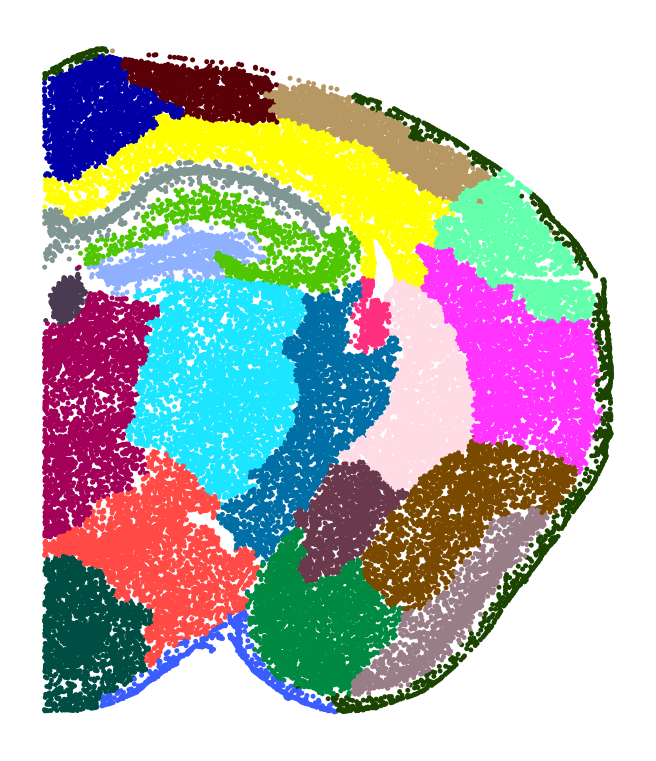

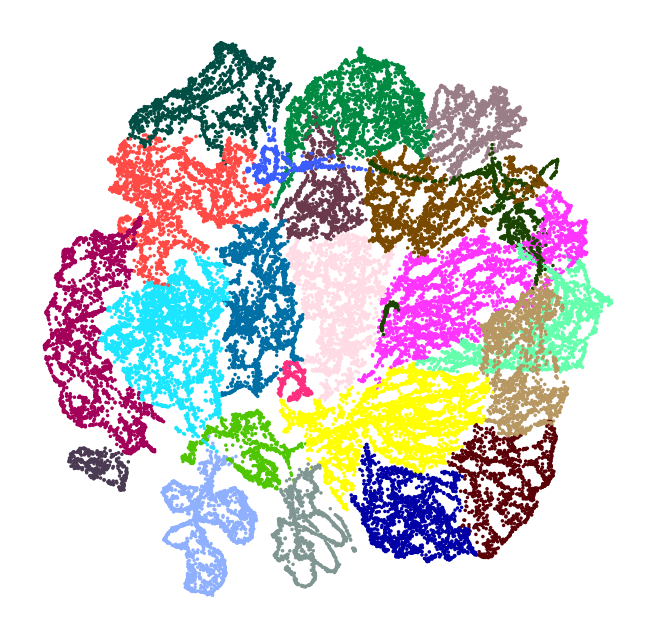

In [12]:
sc.set_figure_params(figsize=figsize)
sc.pl.embedding(adata, basis='spatial', color=layer, s=20, legend_loc=None, return_fig=True, title='', palette=region_cmap)
plt.axis('off')
figname = f'tissue_colored_by_regions_{layer}.png'
savepath = os.path.join(basepath, figname)
plt.savefig(savepath, bbox_inches='tight', transparent=True, dpi=dpi)

sc.set_figure_params(figsize=(5,5))
sc.pl.embedding(adata, basis=f'X_umap_{layer}', color=layer, s=10, legend_loc=None, return_fig=True, title='', palette=region_cmap)
plt.axis('off')
figname = f'umap_colored_by_regions_{layer}.png'
savepath = os.path.join(basepath, figname)
plt.savefig(savepath, bbox_inches='tight', transparent=True, dpi=dpi)

# Smooth (no correction, no PCA)

In [3]:
adata = sc.read_h5ad('/stanley/WangLab/kamal/code/remote_notebooks/spatial_autocorrelation/adata_all_techniques.h5ad')

### Similarities

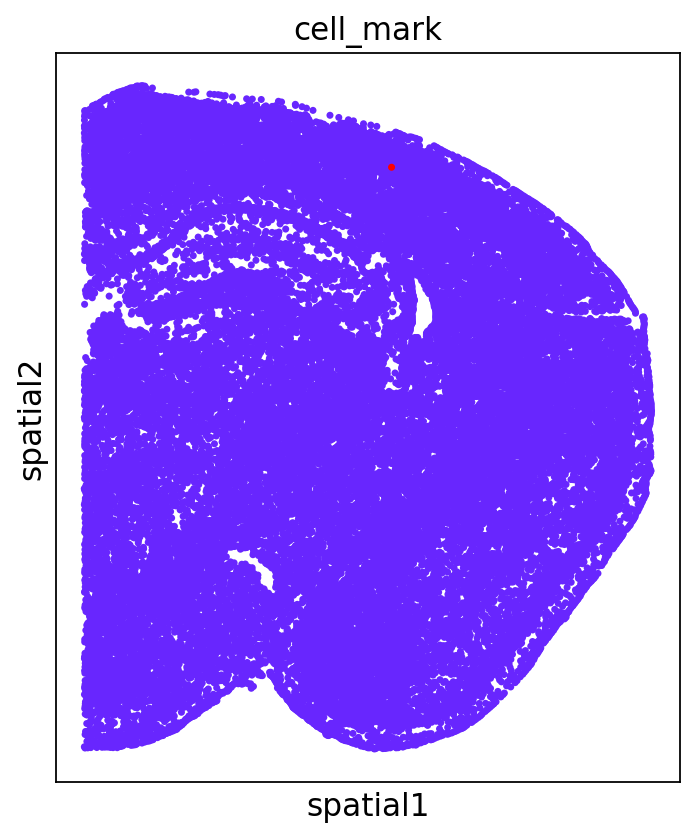

In [4]:
cell_idx = 13009
cell_mark = np.zeros(len(adata))
cell_mark[cell_idx] = 1
adata.obs['cell_mark'] = cell_mark

sc.set_figure_params(figsize=figsize)
# sc.pl.embedding(adata, basis='spatial', color='cell_mark', cmap='rainbow', s=40, vmin=-0.05, colorbar_loc=None, return_fig=True)
sc.pl.embedding(adata, basis='spatial', color='cell_mark', cmap='rainbow', s=40, vmin=-0.05, colorbar_loc=None)
# plt.axis('off')
# plt.title('')
# figname = f'cell_mark.png'
# savepath = os.path.join(basepath, figname)
# plt.savefig(savepath, bbox_inches='tight', transparent=True, dpi=dpi)

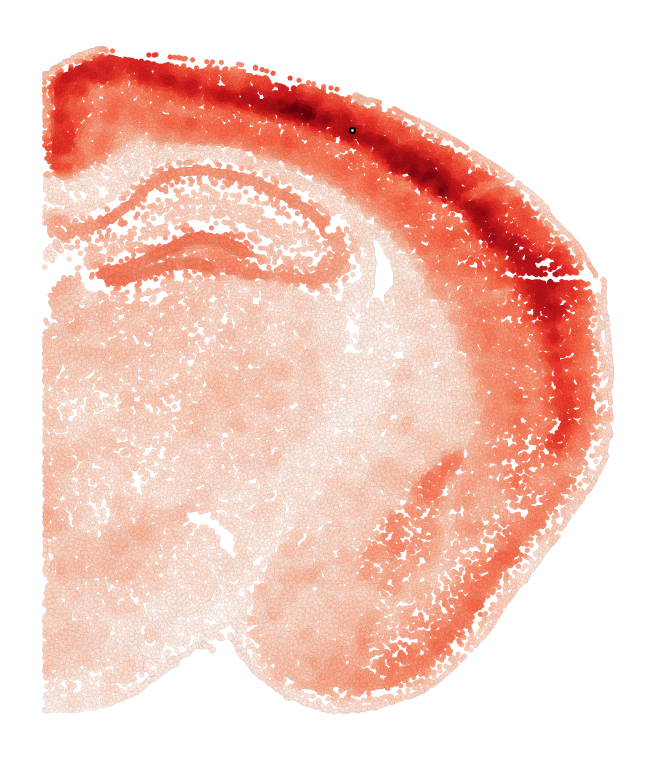

In [5]:
layer = 'smooth'

# X = adata.layers[layer].copy()
X = adata.obsm['X_pca_smooth']
adata.obs['similarity'] = X[cell_idx] @ X.T
other_cell_idxs = np.where(np.arange(len(adata)) != cell_idx)[0]
subdata = adata[other_cell_idxs]
# subdata = adata

sc.set_figure_params(figsize=figsize)
sc.pl.embedding(subdata, basis='spatial', color='similarity', cmap='Reds', s=20, colorbar_loc=None, return_fig=True, title='', edgecolor='k', linewidth=0.02)
plt.scatter(*adata[cell_idx].obsm['spatial'].T, color='w', s=5, edgecolor='k')
plt.axis('off')
figname = f'similarity_{layer}.png'
savepath = os.path.join(basepath, figname)
# plt.savefig(savepath, bbox_inches='tight', transparent=True, dpi=dpi)

In [6]:
k = 15
lim = np.sort(adata.obs['similarity'].values)[::-1][k]
subdata.obs['most_similar'] = subdata.obs['similarity'] >= lim
subdata.obs['most_similar'] = subdata.obs['most_similar'].astype(str)

/local/scratch/38672480.1.interactive/ipykernel_232823/2853408758.py:3: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  subdata.obs['most_similar'] = subdata.obs['similarity'] >= lim


/stanley/WangLab/envs/neighbors/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: In a future version of pandas all arguments of Categorical.replace except for the argument 'value' will be keyword-only.
  values = values.replace(values.categories.difference(groups), np.nan)
/stanley/WangLab/envs/neighbors/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


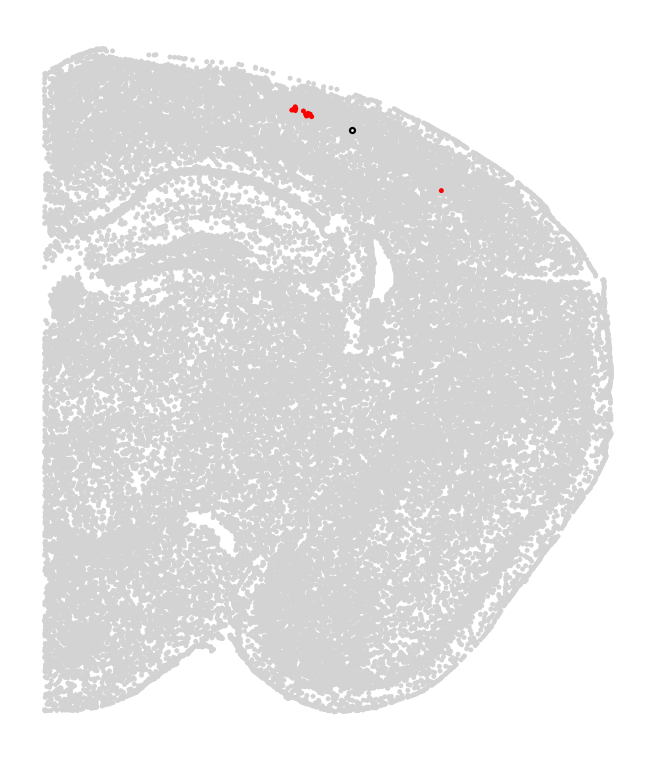

In [7]:
k = 15
sc.set_figure_params(figsize=figsize)
sc.pl.embedding(subdata, basis='spatial', color='most_similar', groups='True', palette=['r'], s=20, legend_loc=None, return_fig=True, title='')
plt.scatter(*adata[cell_idx].obsm['spatial'].T, color='w', s=5, edgecolor='k')
plt.axis('off')
figname = f'most_similar_{layer}.png'
savepath = os.path.join(basepath, figname)
# plt.savefig(savepath, bbox_inches='tight', transparent=True, dpi=dpi)

In [14]:
x,y = adata.obsm['spatial'][cell_idx]
window = 1000

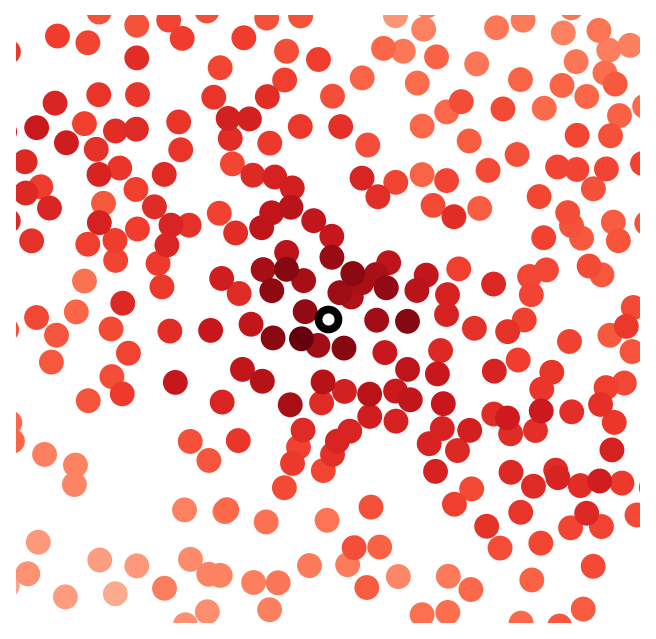

In [15]:
sc.set_figure_params(figsize=(5,5))
sc.pl.embedding(subdata, basis='spatial', color='similarity', cmap='Reds', s=500, colorbar_loc=None, return_fig=True, title='')
plt.scatter(*adata[cell_idx].obsm['spatial'].T, color='w', s=80, edgecolor='k', linewidth=3.5)
plt.axis('off')
plt.xlim(x-window,x+window)
plt.ylim(y-window,y+window)
figname = f'similarity_{layer}_zoom.png'
savepath = os.path.join(basepath, figname)
plt.savefig(savepath, bbox_inches='tight', transparent=True, dpi=dpi)

/stanley/WangLab/envs/neighbors/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


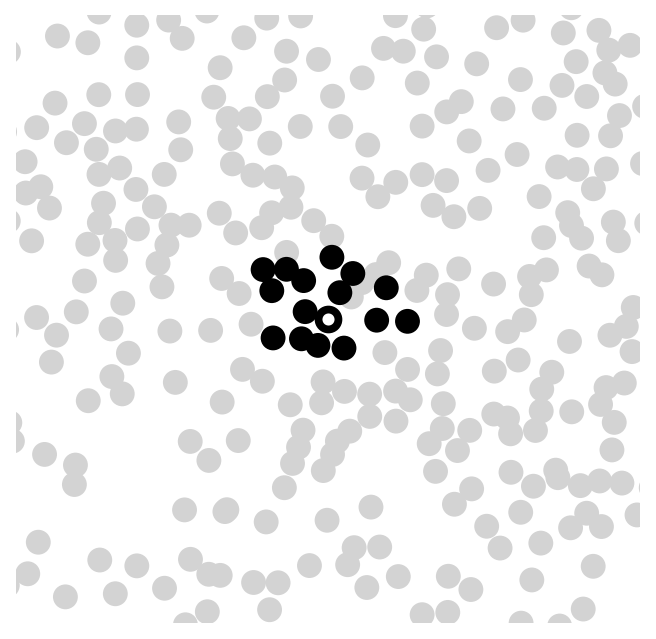

In [15]:
k = 15
sc.set_figure_params(figsize=(5,5))
sc.pl.embedding(subdata, basis='spatial', color='most_similar', groups='True', palette=['k'], s=500, legend_loc=None, return_fig=True, title='')
plt.scatter(*adata[cell_idx].obsm['spatial'].T, color='w', s=80, edgecolor='k', linewidth=3.5)
plt.axis('off')
plt.xlim(x-window,x+window)
plt.ylim(y-window,y+window)
figname = f'most_similar_{layer}_zoom.png'
savepath = os.path.join(basepath, figname)
plt.savefig(savepath, bbox_inches='tight', transparent=True, dpi=dpi)

/local/scratch/38670432.1.interactive/ipykernel_256541/3069126349.py:5: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cbar = fig.colorbar(cax, ticks=[0, 1])


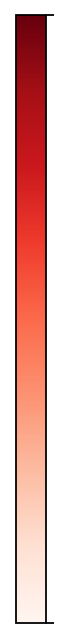

In [16]:
# colorbar only
fig = plt.figure()
cax = plt.imshow(np.array([[0,1]]), cmap='Reds')
plt.gca().set_visible(False)
cbar = fig.colorbar(cax, ticks=[0, 1])
cbar.ax.set_yticklabels(['', ''])
figname = 'cbar.png'
savepath = os.path.join(basepath, figname)
plt.savefig(savepath, bbox_inches='tight')
plt.show()

### Clustering

In [6]:
layer = 'smooth'

In [8]:
adata.obsm['X_smooth'] = adata.layers[layer]
newlayer = layer+'_nopca'
sc.pp.neighbors(adata, use_rep='X_smooth', key_added=newlayer)
sc.tl.leiden(adata, neighbors_key=newlayer, key_added=newlayer, resolution=0.22)
adata.obsm[f'X_umap_{newlayer}'] = sc.tl.umap(adata, neighbors_key=newlayer, copy=True).obsm['X_umap']

In [10]:
# sc.tl.leiden(adata, neighbors_key=layer, key_added=layer, resolution=0.21)
# palette = sc.pl.palettes.default_102
# region_cmap = {str(i):palette[i] for i in range(len(palette))}

In [11]:
adata.obs[newlayer]

index
359677    18
359681    18
359682    18
359683    18
359684    18
          ..
404552    12
404553    12
404555    12
404557    12
404558    12
Name: smooth, Length: 37928, dtype: category
Categories (23, object): ['0', '1', '2', '3', ..., '19', '20', '21', '22']

In [3]:
adata = sc.read_h5ad('/stanley/WangLab/kamal/code/remote_notebooks/spatial_autocorrelation/adata_all_techniques_nopca.h5ad')

In [27]:
layer = 'smooth'
newlayer = layer+'_nopca'

In [28]:
# palette = sc.pl.palettes.default_28
palette = sc.pl.palettes.default_102

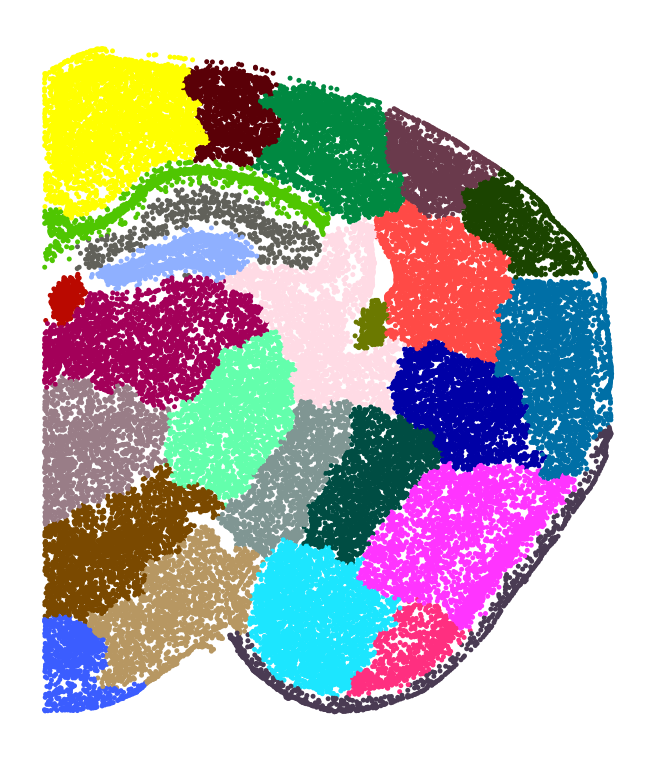

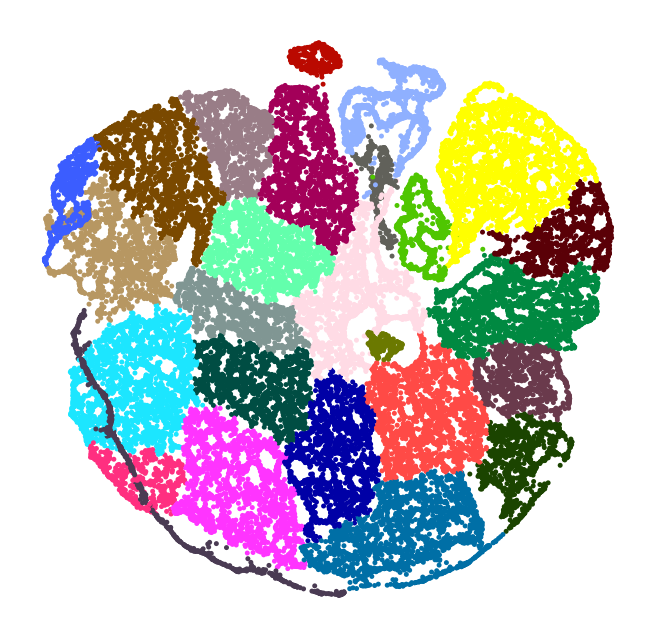

In [29]:
sc.set_figure_params(figsize=figsize)
sc.pl.embedding(adata, basis='spatial', color=newlayer, s=20, legend_loc=None, return_fig=True, title='', palette=palette)
plt.axis('off')
figname = f'tissue_colored_by_regions_{newlayer}.png'
savepath = os.path.join(basepath, figname)
plt.savefig(savepath, bbox_inches='tight', transparent=True, dpi=dpi)

sc.set_figure_params(figsize=(5,5))
sc.pl.embedding(adata, basis=f'X_umap_{newlayer}', color=newlayer, s=20, legend_loc=None, return_fig=True, title='', palette=palette)
plt.axis('off')
figname = f'umap_colored_by_regions_{newlayer}.png'
savepath = os.path.join(basepath, figname)
plt.savefig(savepath, bbox_inches='tight', transparent=True, dpi=dpi)

In [14]:
# adata.write('/stanley/WangLab/kamal/code/remote_notebooks/spatial_autocorrelation/adata_all_techniques_nopca.h5ad')

# Smooth (subsampled)

### Similarities

In [8]:
layer = 'smooth_subsampled'

# X = adata.layers[layer].copy()
# adata.obs['similarity'] = X[cell_idx] @ X.T
# other_cell_idxs = np.where(np.arange(len(adata)) != cell_idx)[0]
# subdata = adata[other_cell_idxs]

# sc.set_figure_params(figsize=figsize)
# sc.pl.embedding(subdata, basis='spatial', color='similarity', cmap='rainbow', s=20, colorbar_loc=None, return_fig=True, title='')
# plt.axis('off')
# figname = f'similarity_{layer}.png'
# savepath = os.path.join(basepath, figname)
# plt.savefig(savepath, bbox_inches='tight', transparent=True, dpi=dpi)

## Clustering

In [6]:
# pca = PCA(n_components=50)
# adata.obsm[f'X_pca_{layer}'] = pca.fit_transform(X)

# sc.pp.neighbors(adata, use_rep=f'X_pca_{layer}', key_added=layer)
# sc.tl.leiden(adata, neighbors_key=layer, key_added=layer, resolution=0.7)
# adata.obsm[f'X_umap_{layer}'] = sc.tl.umap(adata, neighbors_key=layer, copy=True).obsm['X_umap']

In [7]:
# sc.tl.leiden(adata, neighbors_key=layer, key_added=layer, resolution=0.54)

In [8]:
# adata.obs[layer].unique()

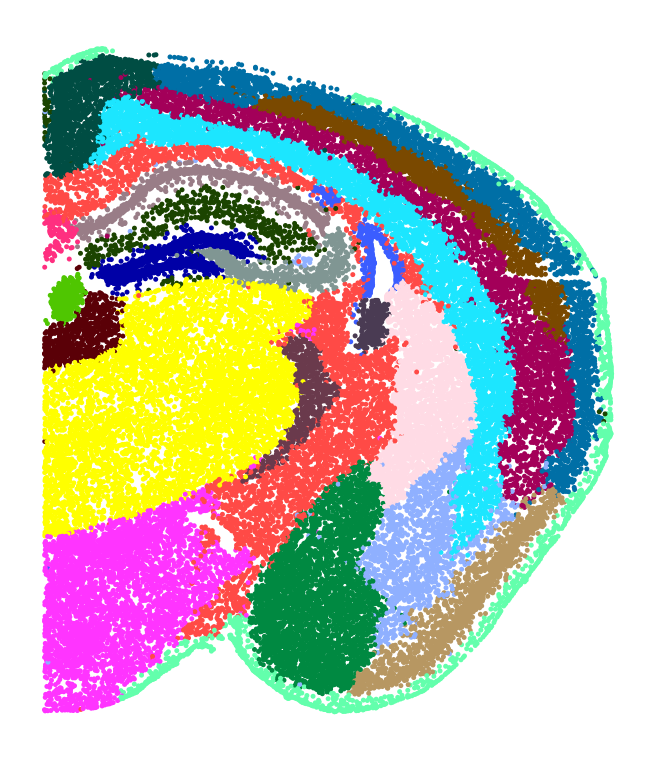

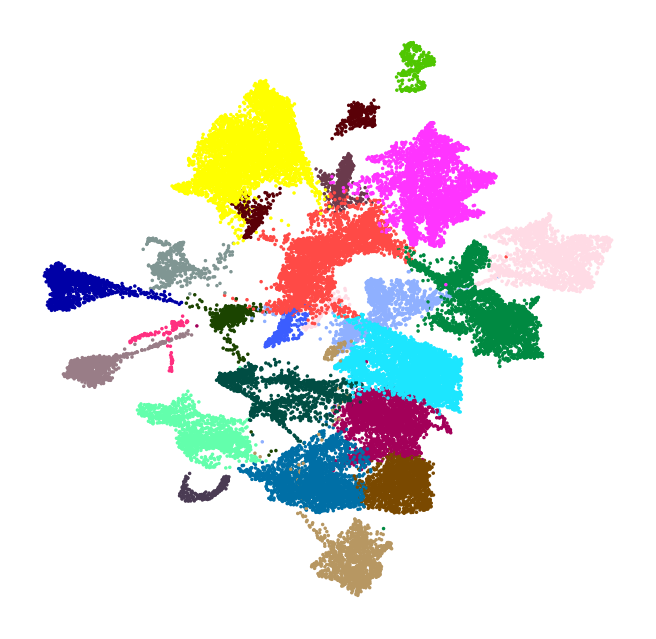

In [13]:
sc.set_figure_params(figsize=figsize)
sc.pl.embedding(adata, basis='spatial', color=layer, s=20, legend_loc=None, return_fig=True, title='', palette=region_cmap)
plt.axis('off')
figname = f'tissue_colored_by_regions_{layer}.png'
savepath = os.path.join(basepath, figname)
plt.savefig(savepath, bbox_inches='tight', transparent=True, dpi=dpi)

sc.set_figure_params(figsize=(5,5))
sc.pl.embedding(adata, basis=f'X_umap_{layer}', color=layer, s=10, legend_loc=None, return_fig=True, title='', palette=region_cmap)
plt.axis('off')
figname = f'umap_colored_by_regions_{layer}.png'
savepath = os.path.join(basepath, figname)
plt.savefig(savepath, bbox_inches='tight', transparent=True, dpi=dpi)

### no pca

In [31]:
layer = 'smooth_subsampled'

In [22]:
adata.obsm['X_smooth_subsampled'] = adata.layers[layer]
newlayer = layer+'_nopca'
sc.pp.neighbors(adata, use_rep='X_smooth_subsampled', key_added=newlayer)
sc.tl.leiden(adata, neighbors_key=newlayer, key_added=newlayer, resolution=0.22)
adata.obsm[f'X_umap_{newlayer}'] = sc.tl.umap(adata, neighbors_key=newlayer, copy=True).obsm['X_umap']

In [ ]:
# sc.tl.leiden(adata, neighbors_key=layer, key_added=layer, resolution=0.21)
# palette = sc.pl.palettes.default_102
# region_cmap = {str(i):palette[i] for i in range(len(palette))}

In [23]:
adata.obs[layer]

index
359677     5
359681    10
359682    10
359683    10
359684     5
          ..
404552     2
404553     2
404555     2
404557     2
404558     2
Name: smooth_subsampled, Length: 37928, dtype: category
Categories (23, object): ['0', '1', '2', '3', ..., '19', '20', '21', '22']

In [ ]:
palette = sc.pl.palettes.default_28
# palette = sc.pl.palettes.default_102

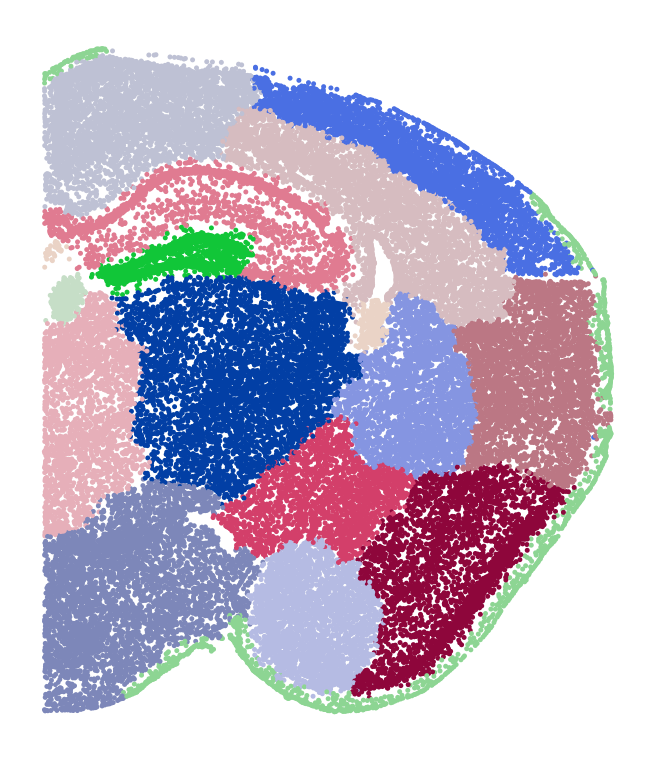

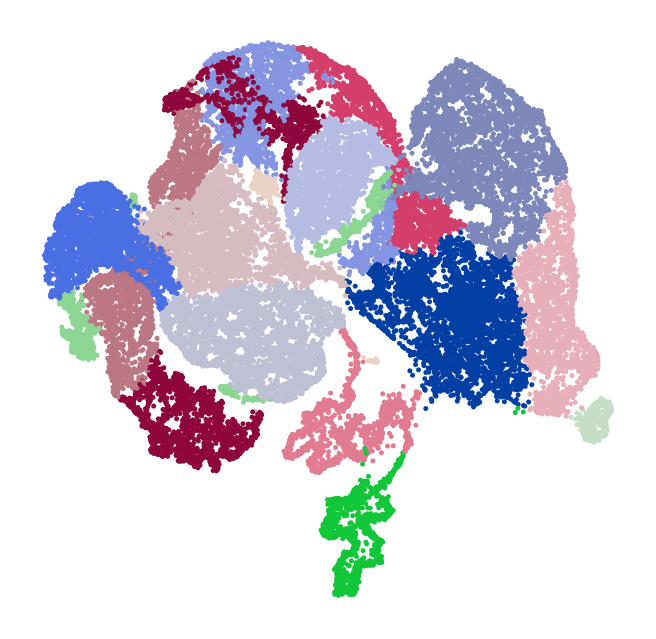

In [25]:
sc.set_figure_params(figsize=figsize)
sc.pl.embedding(adata, basis='spatial', color=newlayer, s=20, legend_loc=None, return_fig=True, title='', palette=palette)
plt.axis('off')
figname = f'tissue_colored_by_regions_{newlayer}.png'
savepath = os.path.join(basepath, figname)
plt.savefig(savepath, bbox_inches='tight', transparent=True, dpi=dpi)

sc.set_figure_params(figsize=(5,5))
sc.pl.embedding(adata, basis=f'X_umap_{newlayer}', color=newlayer, s=20, legend_loc=None, return_fig=True, title='', palette=palette)
plt.axis('off')
figname = f'umap_colored_by_regions_{newlayer}.png'
savepath = os.path.join(basepath, figname)
plt.savefig(savepath, bbox_inches='tight', transparent=True, dpi=dpi)

### Similarities

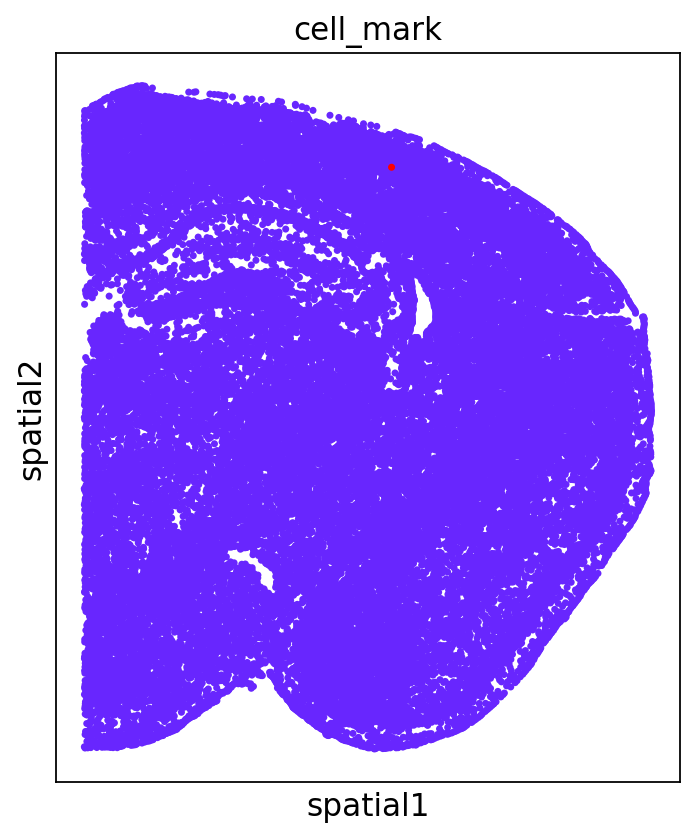

In [9]:
cell_idx = 13009
cell_mark = np.zeros(len(adata))
cell_mark[cell_idx] = 1
adata.obs['cell_mark'] = cell_mark

sc.set_figure_params(figsize=figsize)
# sc.pl.embedding(adata, basis='spatial', color='cell_mark', cmap='rainbow', s=40, vmin=-0.05, colorbar_loc=None, return_fig=True)
sc.pl.embedding(adata, basis='spatial', color='cell_mark', cmap='rainbow', s=40, vmin=-0.05, colorbar_loc=None)
# plt.axis('off')
# plt.title('')
# figname = f'cell_mark.png'
# savepath = os.path.join(basepath, figname)
# plt.savefig(savepath, bbox_inches='tight', transparent=True, dpi=dpi)

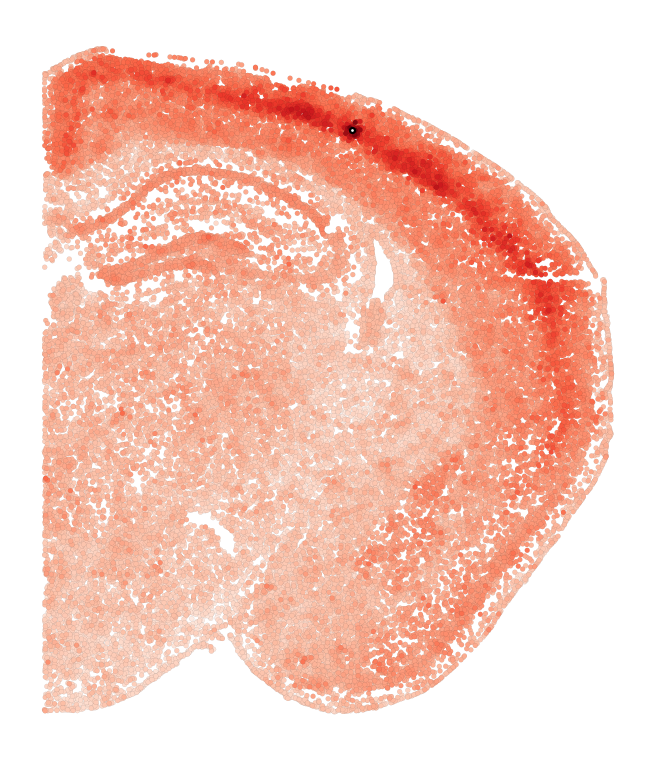

In [17]:
layer = 'smooth_subsampled'

X = adata.layers[layer].copy()
adata.obs['similarity'] = X[cell_idx] @ X.T
other_cell_idxs = np.where(np.arange(len(adata)) != cell_idx)[0]
subdata = adata[other_cell_idxs]
# subdata = adata

sc.set_figure_params(figsize=figsize)
sc.pl.embedding(subdata, basis='spatial', color='similarity', cmap='Reds', s=20, colorbar_loc=None, return_fig=True, title='', edgecolor='k', linewidth=0.02)
plt.scatter(*adata[cell_idx].obsm['spatial'].T, color='w', s=5, edgecolor='k')
plt.axis('off')
figname = f'similarity_{layer}.png'
savepath = os.path.join(basepath, figname)
plt.savefig(savepath, bbox_inches='tight', transparent=True, dpi=dpi)

In [20]:
k = 15
lim = np.sort(adata.obs['similarity'].values)[::-1][k]
subdata.obs['most_similar'] = subdata.obs['similarity'] >= lim
subdata.obs['most_similar'] = subdata.obs['most_similar'].astype(str)

/local/scratch/38672480.1.interactive/ipykernel_232823/2853408758.py:3: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  subdata.obs['most_similar'] = subdata.obs['similarity'] >= lim


/stanley/WangLab/envs/neighbors/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: In a future version of pandas all arguments of Categorical.replace except for the argument 'value' will be keyword-only.
  values = values.replace(values.categories.difference(groups), np.nan)
/stanley/WangLab/envs/neighbors/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


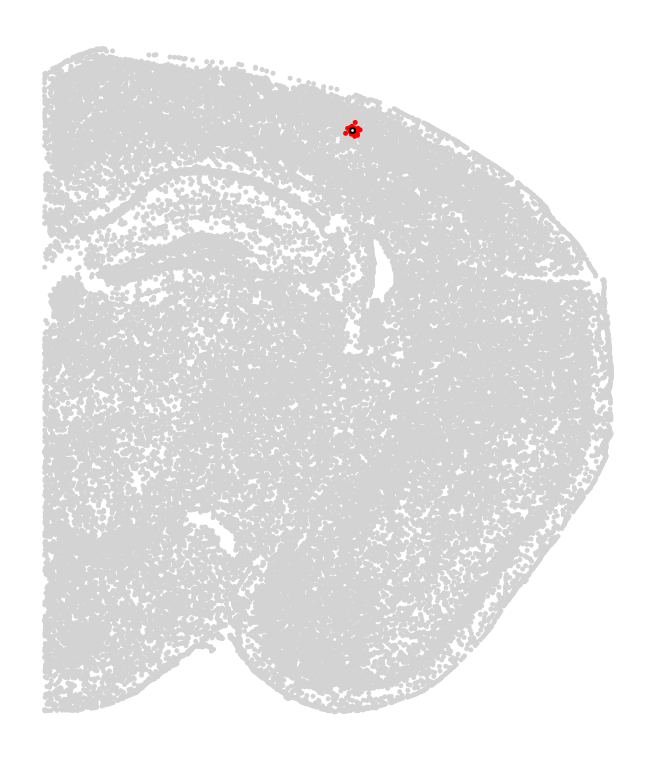

In [12]:
k = 15
sc.set_figure_params(figsize=figsize)
sc.pl.embedding(subdata, basis='spatial', color='most_similar', groups='True', palette=['r'], s=20, legend_loc=None, return_fig=True, title='')
plt.scatter(*adata[cell_idx].obsm['spatial'].T, color='w', s=5, edgecolor='k')
plt.axis('off')
figname = f'most_similar_{layer}.png'
savepath = os.path.join(basepath, figname)
# plt.savefig(savepath, bbox_inches='tight', transparent=True, dpi=dpi)

In [21]:
x,y = adata.obsm['spatial'][cell_idx]
window = 1000

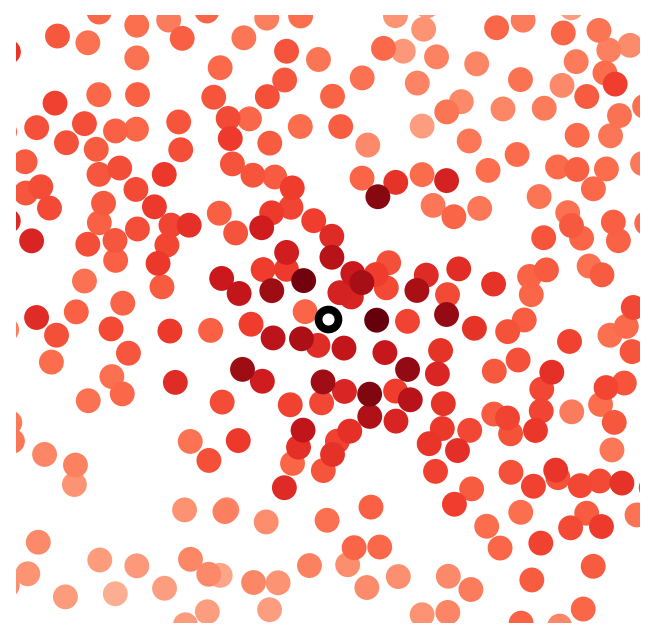

In [22]:
sc.set_figure_params(figsize=(5,5))
sc.pl.embedding(subdata, basis='spatial', color='similarity', cmap='Reds', s=500, colorbar_loc=None, return_fig=True, title='')
plt.scatter(*adata[cell_idx].obsm['spatial'].T, color='w', s=80, edgecolor='k', linewidth=3.5)
plt.axis('off')
plt.xlim(x-window,x+window)
plt.ylim(y-window,y+window)
figname = f'similarity_{layer}_zoom.png'
savepath = os.path.join(basepath, figname)
plt.savefig(savepath, bbox_inches='tight', transparent=True, dpi=dpi)

/stanley/WangLab/envs/neighbors/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: In a future version of pandas all arguments of Categorical.replace except for the argument 'value' will be keyword-only.
  values = values.replace(values.categories.difference(groups), np.nan)
/stanley/WangLab/envs/neighbors/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


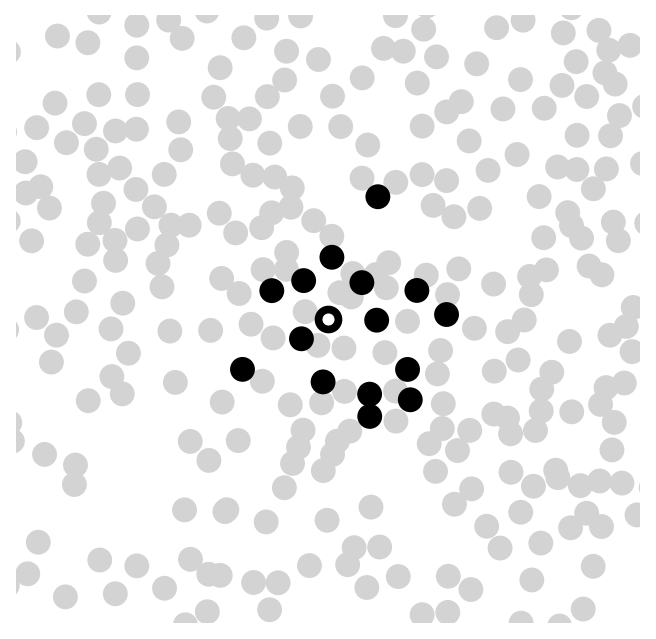

In [23]:
k = 15
sc.set_figure_params(figsize=(5,5))
sc.pl.embedding(subdata, basis='spatial', color='most_similar', groups='True', palette=['k'], s=500, legend_loc=None, return_fig=True, title='')
plt.scatter(*adata[cell_idx].obsm['spatial'].T, color='w', s=80, edgecolor='k', linewidth=3.5)
plt.axis('off')
plt.xlim(x-window,x+window)
plt.ylim(y-window,y+window)
figname = f'most_similar_{layer}_zoom.png'
savepath = os.path.join(basepath, figname)
plt.savefig(savepath, bbox_inches='tight', transparent=True, dpi=dpi)

/local/scratch/38670432.1.interactive/ipykernel_256541/3069126349.py:5: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cbar = fig.colorbar(cax, ticks=[0, 1])


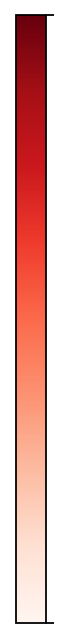

In [ ]:
# colorbar only
fig = plt.figure()
cax = plt.imshow(np.array([[0,1]]), cmap='Reds')
plt.gca().set_visible(False)
cbar = fig.colorbar(cax, ticks=[0, 1])
cbar.ax.set_yticklabels(['', ''])
figname = 'cbar.png'
savepath = os.path.join(basepath, figname)
plt.savefig(savepath, bbox_inches='tight')
plt.show()

## Recolor

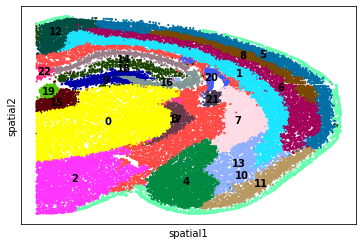

In [9]:
sc.pl.embedding(adata, basis='spatial', color=layer, s=20, legend_loc='on data', title='', palette=region_cmap)

/stanley/WangLab/envs/neighbors/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


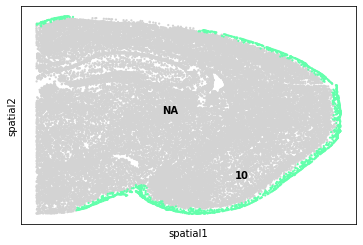

In [10]:
sc.pl.embedding(adata, basis='spatial', groups=['10'], color=layer, s=20, legend_loc='on data', title='', palette=region_cmap)

In [11]:
leiden2region = {
    '0': 'TH',
    '1': 'L6',
    '2': 'HY',
    '3': 'fiber tract',
    '4': 'MEA/COA',
    '5': 'L2/3',
    '6': 'L5',
    '7': 'CP',
    '8': 'L4',
    '9': 'DG',
    '10': 'meninges/L1',
    '11': 'PIR',
    '12': 'RSP',
    '13': 'BLA',
    '14': 'CA1',
    '15': 'LHb',
    '16': 'CA2/3',
    '17': 'RT',
    '18': 'HPFmo',
    '19': 'MHb',
    '20': 'VL',
    '21': 'chpl1',
    '22': 'chpl2',
}
adata.obs[f'region_{layer}'] = adata.obs[layer].map(leiden2region)
adata.obs[f'region_{layer}'] = adata.obs[f'region_{layer}'].astype('category')
regions = adata.obs[f'region_{layer}'].unique()
palette = sc.pl.palettes.default_102
cmap = {regions[i]:palette[i] for i in range(len(regions))}

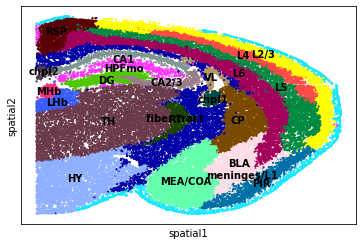

In [12]:
sc.pl.embedding(adata, basis='spatial', color=f'region_{layer}', s=20, legend_loc='on data', title='', palette=cmap)

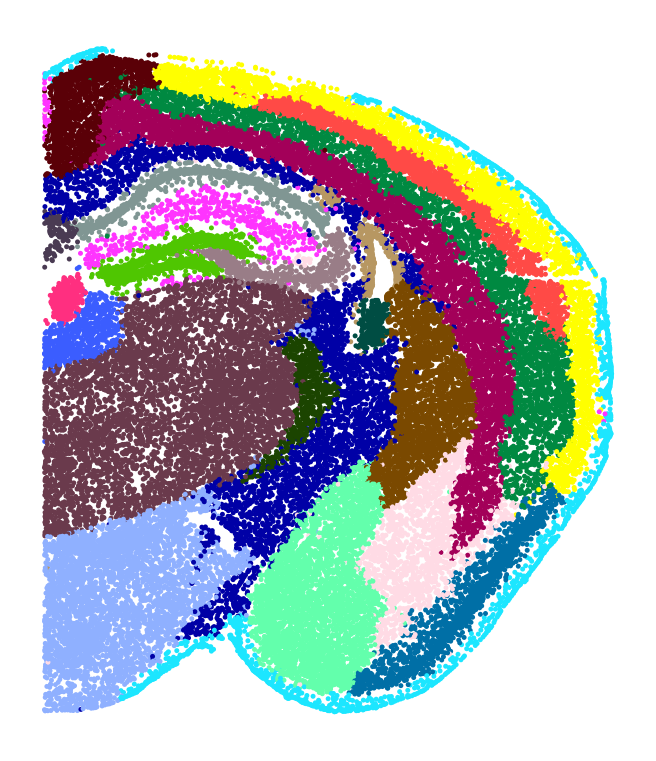

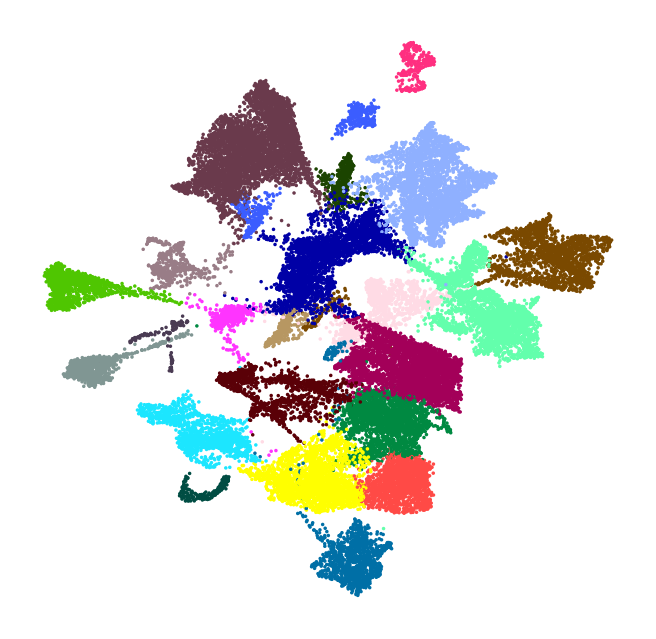

In [13]:
sc.set_figure_params(figsize=figsize)
sc.pl.embedding(adata, basis='spatial', color=f'region_{layer}', s=20, legend_loc=None, return_fig=True, title='', palette=cmap)
plt.axis('off')
figname = f'tissue_colored_by_regions_{layer}.png'
savepath = os.path.join(basepath, figname)
plt.savefig(savepath, bbox_inches='tight', transparent=True, dpi=dpi)

sc.set_figure_params(figsize=(5,5))
sc.pl.embedding(adata, basis=f'X_umap_{layer}', color=f'region_{layer}', s=10, legend_loc=None, return_fig=True, title='', palette=cmap)
plt.axis('off')
figname = f'umap_colored_by_regions_{layer}.png'
savepath = os.path.join(basepath, figname)
plt.savefig(savepath, bbox_inches='tight', transparent=True, dpi=dpi)

# Concatenated

### Similarities

In [14]:
layer = 'concat'

# X = adata.obsm[layer].copy()
# adata.obs['similarity'] = X[cell_idx] @ X.T
# other_cell_idxs = np.where(np.arange(len(adata)) != cell_idx)[0]
# subdata = adata[other_cell_idxs]

# sc.set_figure_params(figsize=figsize)
# sc.pl.embedding(subdata, basis='spatial', color='similarity', cmap='rainbow', s=20, colorbar_loc=None, return_fig=True, title='')
# plt.axis('off')
# figname = f'similarity_{layer}.png'
# savepath = os.path.join(basepath, figname)
# plt.savefig(savepath, bbox_inches='tight', transparent=True, dpi=dpi)

### Clustering

In [15]:
# pca = PCA(n_components=50)
# adata.obsm[f'X_pca_{layer}'] = pca.fit_transform(X)

# sc.pp.neighbors(adata, use_rep=f'X_pca_{layer}', key_added=layer)
# sc.tl.leiden(adata, neighbors_key=layer, key_added=layer, resolution=0.7)
# adata.obsm[f'X_umap_{layer}'] = sc.tl.umap(adata, neighbors_key=layer, copy=True).obsm['X_umap']

In [16]:
# sc.tl.leiden(adata, neighbors_key=layer, key_added=layer, resolution=0.65)

In [17]:
# adata.obs[layer].unique()

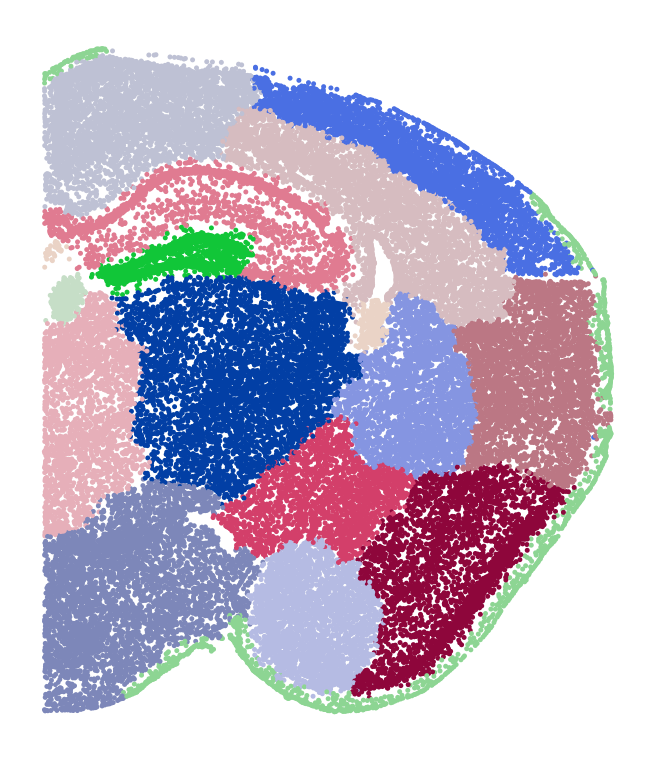

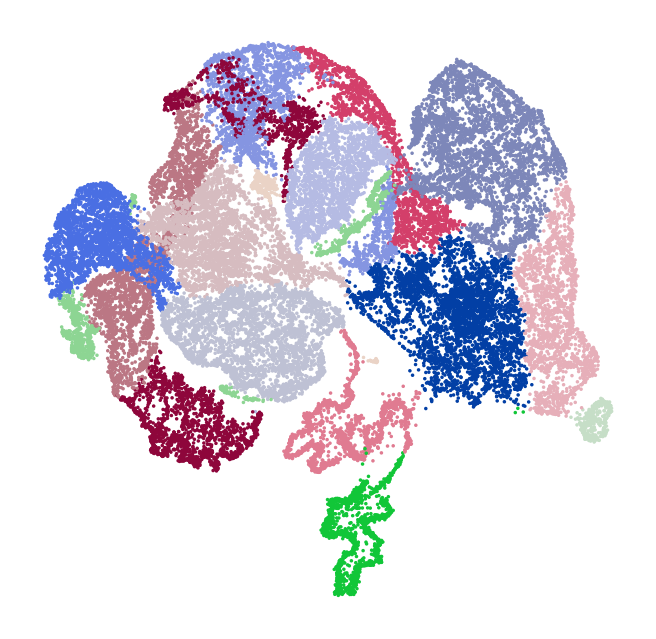

In [24]:
sc.set_figure_params(figsize=figsize)
sc.pl.embedding(adata, basis='spatial', color=newlayer, s=20, legend_loc=None, return_fig=True, title='', palette=palette)
plt.axis('off')
figname = f'tissue_colored_by_regions_{newlayer}.png'
savepath = os.path.join(basepath, figname)
plt.savefig(savepath, bbox_inches='tight', transparent=True, dpi=dpi)

sc.set_figure_params(figsize=(5,5))
sc.pl.embedding(adata, basis=f'X_umap_{newlayer}', color=newlayer, s=10, legend_loc=None, return_fig=True, title='', palette=palette)
plt.axis('off')
figname = f'umap_colored_by_regions_{newlayer}.png'
savepath = os.path.join(basepath, figname)
plt.savefig(savepath, bbox_inches='tight', transparent=True, dpi=dpi)

## Recolor

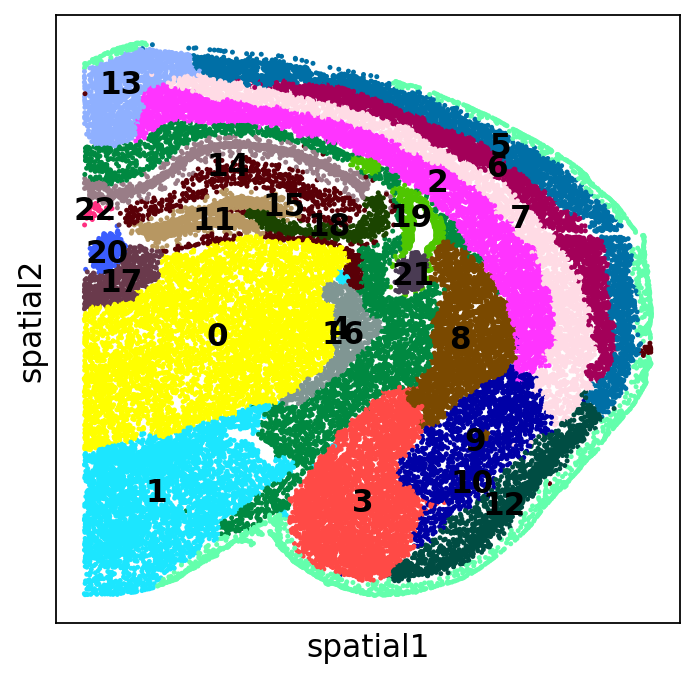

In [18]:
sc.pl.embedding(adata, basis='spatial', color=layer, s=20, legend_loc='on data', title='', palette=region_cmap)

/stanley/WangLab/envs/neighbors/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


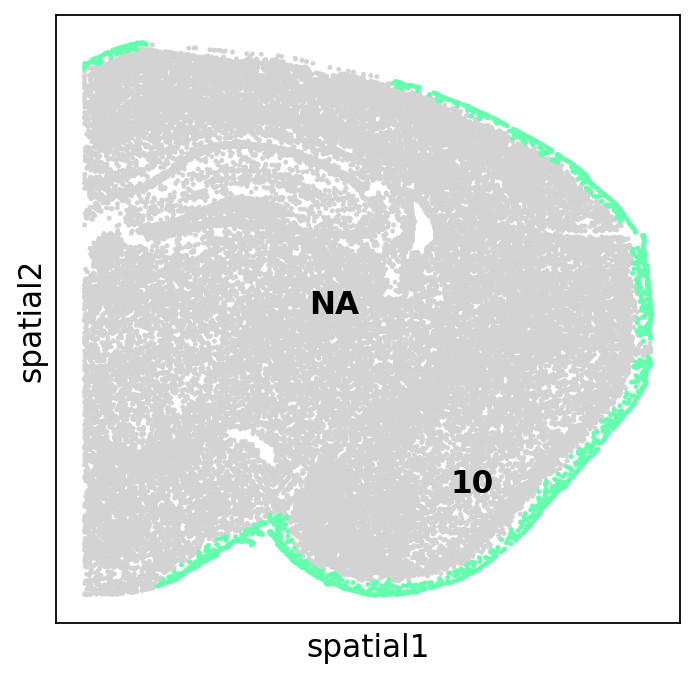

In [19]:
sc.pl.embedding(adata, basis='spatial', groups=['10'], color=layer, s=20, legend_loc='on data', title='', palette=region_cmap)

In [20]:
leiden2region = {
    '0': 'TH',
    '1': 'HY',
    '2': 'L6',
    '3': 'MEA/COA',
    '4': 'fiber tract',
    '5': 'L2/3',
    '6': 'L4',
    '7': 'L5',
    '8': 'CP',
    '9': 'BLA',
    '10': 'meninges/L1',
    '11': 'DG',
    '12': 'PIR',
    '13': 'RSP',
    '14': 'CA1',
    '15': 'HPFmo',
    '16': 'RT',
    '17': 'LHb',
    '18': 'CA2/3',
    '19': 'VL',
    '20': 'MHb',
    '21': 'chpl1',
    '22': 'chpl2',
}
adata.obs[f'region_{layer}'] = adata.obs[layer].map(leiden2region)
adata.obs[f'region_{layer}'] = adata.obs[f'region_{layer}'].astype('category')
# regions = adata.obs[f'region_{layer}'].unique()
# palette = sc.pl.palettes.default_102
# cmap = {regions[i]:palette[i] for i in range(len(regions))}

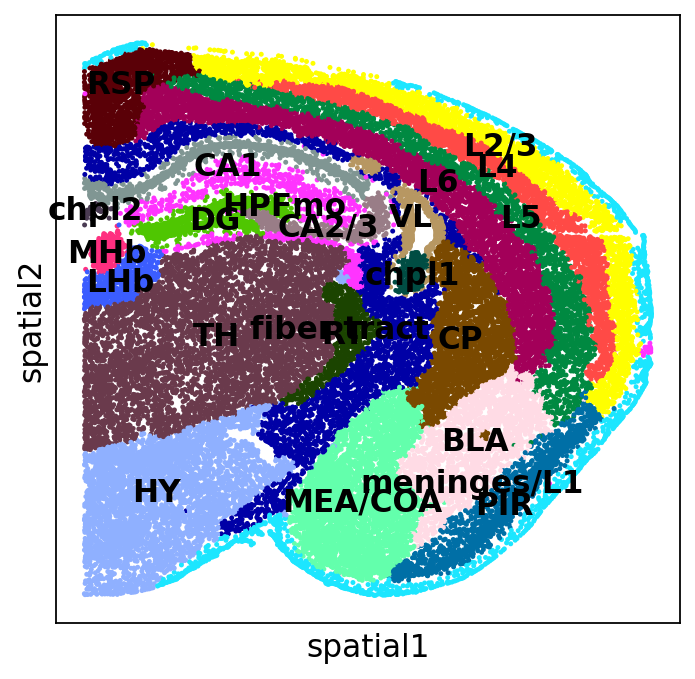

In [21]:
sc.pl.embedding(adata, basis='spatial', color=f'region_{layer}', s=20, legend_loc='on data', title='', palette=cmap)

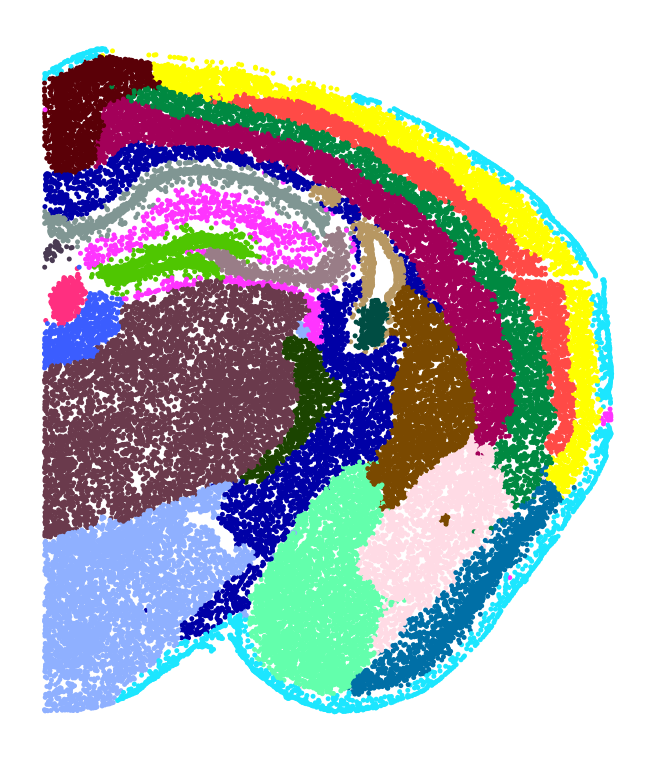

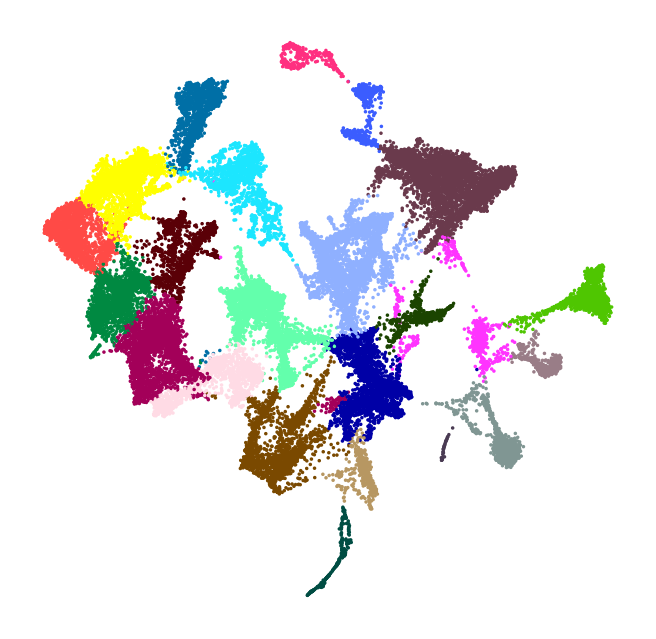

In [22]:
sc.set_figure_params(figsize=figsize)
sc.pl.embedding(adata, basis='spatial', color=f'region_{layer}', s=20, legend_loc=None, return_fig=True, title='', palette=cmap)
plt.axis('off')
figname = f'tissue_colored_by_regions_{layer}.png'
savepath = os.path.join(basepath, figname)
plt.savefig(savepath, bbox_inches='tight', transparent=True, dpi=dpi)

sc.set_figure_params(figsize=(5,5))
sc.pl.embedding(adata, basis=f'X_umap_{layer}', color=f'region_{layer}', s=10, legend_loc=None, return_fig=True, title='', palette=cmap)
plt.axis('off')
figname = f'umap_colored_by_regions_{layer}.png'
savepath = os.path.join(basepath, figname)
plt.savefig(savepath, bbox_inches='tight', transparent=True, dpi=dpi)

# Save adata

In [48]:
adata.write('/stanley/WangLab/kamal/code/remote_notebooks/spatial_autocorrelation/adata_all_techniques.h5ad')